# Raw VS smoothed in situ drifters focalised one on drifter type
- global distribution figure
- global rms figure

In [3]:
import os
from glob import glob

import numpy as np
import pandas as pd
import xarray as xr

%matplotlib inline
import matplotlib.pyplot as plt
import hvplot.xarray  # noqa
import holoviews as hv
#
import pynsitu as pyn
from pynsitu.maps import crs
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.geodesic import Geodesic

from lib import raw_dir, root_dir, smoothed_dir, KEYS, list_type, open_L1_dataset, open_L2_dataset, images_dir

import datetime
from scipy.stats import norm

In [4]:
version = 'v0'
def set_usual_attrs(ds, attrs_ds):
    ds.attrs.update(attrs_ds)
    ds.id.attrs.update(longname="id", description="drifter id")
    ds.time.attrs.update(longname="Time")
    ds.lat.attrs.update(longname="Latitude", units="°")
    ds.lon.attrs.update(longname="Longitude", units="°")
    ds.platform.attrs.update(
        longname="Platform", description="second way of identification"
    )
    ds.x.attrs.update(
        longname="Zonal position",
        description="Zonal position in the local frame",
        units="m",
    )
    ds.y.attrs.update(
        longname="Meridional position",
        description="Meridional position in the local frame",
        units="m",
    )
    ds.X.attrs.update(longname="Position norm", units="m")
    ds.u.attrs.update(
        longname="Zonal velocity",
        description="Zonal velocity computed via centered differentiation from x",
        units="m/s",
    )
    ds.v.attrs.update(
        longname="Meridional velocity",
        description="Meridional velocity computed via centered differentiation from y",
        units="m/s",
    )
    ds.U.attrs.update(longname="Velocity norm", units="m/s")
    ds.ax.attrs.update(
        longname="Zonal acceleration",
        description="Zonal acceleration computed via centered differentiation from x",
        units=r"$m.s^2$",
    )
    ds.ay.attrs.update(
        longname="Meridional acceleration",
        description="Meridional acceleration computed via centered differentiation from y",
        units=r"$m.s^2$",
    )
    ds.Axy.attrs.update(longname="Acceleration norm", description=r"\sqrt(ax^2+ay^2)", units=r"$m.s^2$")
    ds.au.attrs.update(
        longname="Zonal acceleration",
        description="Zonal acceleration computed via centered differentiation from u",
        units=r"$m.s^2$",
    )
    ds.av.attrs.update(
        longname="Meridional acceleration",
        description="Meridional acceleration computed via centered differentiation from v",
        units=r"$m.s^2$",
    )
    ds.Auv.attrs.update(longname="Acceleration norm", description=r"\sqrt(au^2+av^2)", units=r"$m.s^2$")
    
    ds.lonc.attrs.update(
        longname="Longitude of reference",
        description="Longitude used as reference for the local frame projection",
    )
    ds.latc.attrs.update(
        longname="Latitude of reference",
        description="Longitude used as reference for the local frame projection",
    )
    ds.gap_mask.attrs.update(
        longname="Gap mask",
        description="Flags for gaps . CAUTION : values in these gaps (flagged by gap_mask=1) were linearly interpolated to have a regular sampling, and should be masked"
    )
    ds.gaps.attrs.update(
        longname="Gaps",
        description="distance to the nearest raw time",
    )

def apply_optimize_smoothing(path_file_L1_csv, t_target, method, version=version, param=None, maxgap=3*3600):
    # LOAD AND CHECK
    df = pd.read_csv(path_file_L1_csv, parse_dates=["time"], dtype={"id": str}).set_index("id")[['time', 'lat', 'lon',
       'platform', 'x', 'y', 'dt', 'velocity_east', 'velocity_north',
       'velocity', 'acceleration_east', 'acceleration_north', 'acceleration',
       'lonc', 'latc']]
    ds_L1 = xr.open_dataset(path_file_L1_csv.replace('.csv', '.nc'))
    ids = sorted(list(df.index.unique()))

    # OPTIMIZED PARAMETERS
    if not param :
        if method=='lowess' :
            from pynsitu.drifters import parameters_lowess
            param = parameters_lowess.copy()
            if t_target =='1h' or t_target=='1H':
                param['T_low_pass']=2
            print(param)
        if method=='variational' :
            from pynsitu.drifters import parameters_var
            param = parameters_var.copy()
            print(param)
    #3h
    
    #APPLY METHOD
    dfs = pyn.drifters.smooth_all(
    df,
    method,
    t_target,
    parameters=param,
    import_columns=["id", 'platform'],
    maxgap =maxgap,
    spectral_diff=False,
    geo=True,
    )
    
    dss = dfs.reset_index().set_index(["id", "time"]).to_xarray()
    dss['platform']=dfs.set_index('id').platform.groupby('id').first().to_xarray()
    dss['lonc'] = dss['lonc'].mean('time')
    dss['latc'] = dss['latc'].mean('time')
    
    #ATTRS
    attrs_ds = ds_L1.attrs
    attrs_ds['description']=f"L2 product - applied smoothing method on L1-datasets. All gaps of more than {round(maxgap/3600,2)} hours are linearly interpolated to obtain a regularly sampled product and flagged with a ‘gap_mask' = 1 value (‘gap_mask' = 0 otherwise))."
    attrs_ds["generation_date"]=str(datetime.datetime.now())
    if method=='lowess' : 
        attrs_ds['smoothing_method_description'] = f"LOWESS method (polynomial=linear, {param['iteration']} iterations, Elipot et al.2016) + low pass filter with cutoff frequency of {param['cutoff_low_pass']} cpd and computed on {param['T_low_pass']} days, see https://github.com/apatlpo/pynsitu/tree/9eea25a9cb1ea112f9882fc3252de21e4290a47d/pynsitu"
        attrs_ds['smoothing_method_param_dict'] = f'{param}'
    if method=='variational' : 
        attrs_ds['smoothing_method_description'] = 'Variational method, see https://github.com/apatlpo/pynsitu/tree/9eea25a9cb1ea112f9882fc3252de21e4290a47d/pynsitu'
        attrs_ds['smoothing_method_param_dict'] = f'{param}'
    attrs_ds['interpolation_sampling'] = t_target
    attrs_ds['nominal_raw_sampling'] = path_file_L1_csv.split('_')[-1].replace('.csv','')
    attrs_ds['version'] = version
    
    set_usual_attrs(dss, attrs_ds)
    
    def path_(path_file_L1_csv):
        l = path_file_L1_csv.split('_')
        return ('_'.join(l[:-3]+[l[-1].replace('.csv','')])).replace('raw',f'variational_pb').replace('L1_', 'L2_')+f'_{method}_{t_target}_{version}.nc'


    #path = path_(path_file_L1_csv)
    #dss.to_netcdf(path)
    #print(path)
    return dss

In [5]:
def spectrum__(ds, nperseg="10D", detrend='linear', complex=('u','v')):
    spec_id = []
    for i in range(ds.dims['id']):
        try : spec_id.append(ds.isel(id=i).dropna('time').ts.spectrum(unit="1D", nperseg=nperseg, detrend=detrend, complex=complex))
        except : 
            if ds.isel(id=i).dropna('time').time.max()-ds.isel(id=i).dropna('time').time.min()<=pd.Timedelta(nperseg): 
                print(f'{i} too short')
                continue
            else : assert False, i
    return xr.concat(spec_id,dim='id')

def spectrum_var(ds, nperseg="10D", detrend='linear',):
    S = []
    for var in [('x', 'y'),('u', 'v'), ('ax', 'ay')]:
        S.append(spectrum__(ds, nperseg="10D", detrend=detrend, complex=var))
    return xr.merge(S)

________
# Compute variational

In [6]:
ds1 = open_L1_dataset(raw_dir,'svp_ogs_1h')
ds2v = open_L2_dataset(smoothed_dir,'svp_ogs_1h', 'variational', '30min', mask=False, version='v1')
ds2s = open_L2_dataset(smoothed_dir,'svp_ogs_1h', 'lowess', '30min', mask=False)

/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_svp_ogs_20231005_140000_1h.nc
/Users/mdemol/DATA_DRIFTERS/drifters/smoothed/L2_svp_ogs_1h_variational_30min_v1.nc
/Users/mdemol/DATA_DRIFTERS/drifters/smoothed/L2_svp_ogs_1h_lowess_30min_v0.nc


## Pour dti =30min, change accelartion_amplitude
- take 5e-6

In [8]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_svp_ogs_20231005_140000_1h.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-6
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.1e-6
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.5e-6
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=4.9e-6
ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=4.5e-6
ds7 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 11 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 9 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 8 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segm

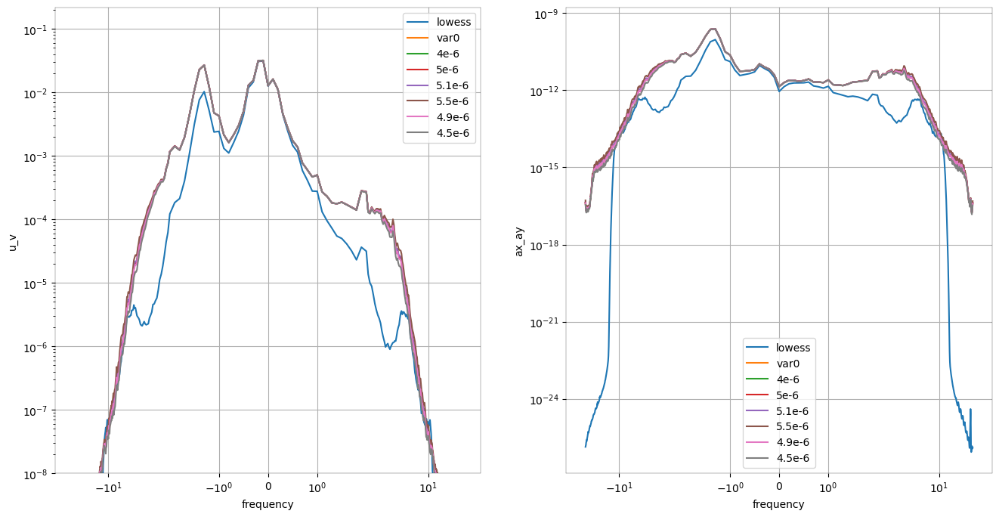

In [9]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var0')
dss2.mean('id').u_v.plot(ax=ax, label='4e-6')
dss3.mean('id').u_v.plot(ax=ax, label='5e-6')
dss4.mean('id').u_v.plot(ax=ax, label='5.1e-6')
dss5.mean('id').u_v.plot(ax=ax, label='5.5e-6')
dss6.mean('id').u_v.plot(ax=ax, label='4.9e-6')
dss7.mean('id').u_v.plot(ax=ax, label='4.5e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax, label='4e-6')
dss3.mean('id').ax_ay.plot(ax=ax, label='5e-6')
dss4.mean('id').ax_ay.plot(ax=ax, label='5.1e-6')
dss5.mean('id').ax_ay.plot(ax=ax, label='5.5e-6')
dss6.mean('id').ax_ay.plot(ax=ax, label='4.9e-6')
dss7.mean('id').ax_ay.plot(ax=ax, label='4.5e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()

In [11]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_svp_ogs_20231005_140000_1h.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-5
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-4
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-3
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 11 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 9 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 8 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segm

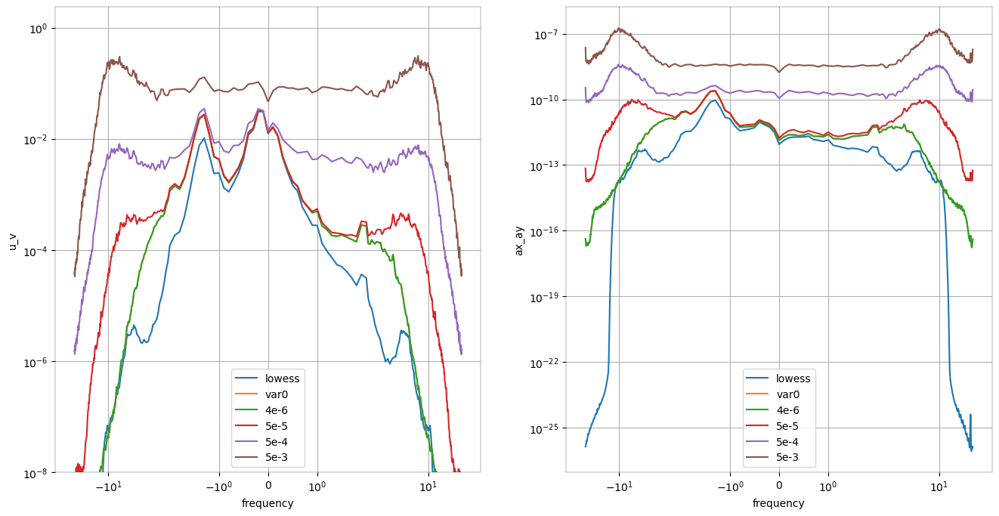

In [12]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var0')
dss2.mean('id').u_v.plot(ax=ax, label='4e-6')
dss3.mean('id').u_v.plot(ax=ax, label='5e-5')
dss4.mean('id').u_v.plot(ax=ax, label='5e-4')
dss5.mean('id').u_v.plot(ax=ax, label='5e-3')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax, label='4e-6')
dss3.mean('id').ax_ay.plot(ax=ax, label='5e-5')
dss4.mean('id').ax_ay.plot(ax=ax, label='5e-4')
dss5.mean('id').ax_ay.plot(ax=ax, label='5e-3')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()

## Pour dti =10min, change accelartion_amplitude
- take 5.1e-6

In [13]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_svp_ogs_20231005_140000_1h.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5e-6
ds3 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.5e-6
ds4 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.2e-6
ds5 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.3e-6
ds6 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)
param_var['acceleration_amplitude']=5.4e-6
ds7 = apply_optimize_smoothing(path_L1, t_target='10min', method='variational', version=version, param=param_var)

Divided into 11 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 9 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 8 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segm


KeyboardInterrupt



In [ ]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var0')
dss2.mean('id').u_v.plot(ax=ax, label='4e-6')
dss3.mean('id').u_v.plot(ax=ax, label='5e-6')
dss4.mean('id').u_v.plot(ax=ax, label='5.5e-6')
dss5.mean('id').u_v.plot(ax=ax, label='5.2e-6')
dss6.mean('id').u_v.plot(ax=ax, label='5.3e-6')
dss7.mean('id').u_v.plot(ax=ax, label='5.4e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess 30min')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var 30min')
dss2.mean('id').ax_ay.plot(ax=ax, label='4e-6')
dss3.mean('id').ax_ay.plot(ax=ax, label='5e-6')
dss4.mean('id').ax_ay.plot(ax=ax, label='5.5e-6')
dss5.mean('id').ax_ay.plot(ax=ax, label='5.5e-6')
dss6.mean('id').ax_ay.plot(ax=ax, label='4.9e-6')
dss7.mean('id').ax_ay.plot(ax=ax, label='4.5e-6')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-15)

## Pour dti =30min, change accelaration_T
- take 

In [14]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_svp_ogs_20231005_140000_1h.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.06*86400
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.04*86400
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.1*86400
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['acceleration_T']=0.01*86400
ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 11 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 9 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 8 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segm

In [15]:
param_var['acceleration_T']=1*86400
ds7 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 11 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 9 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 8 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segm

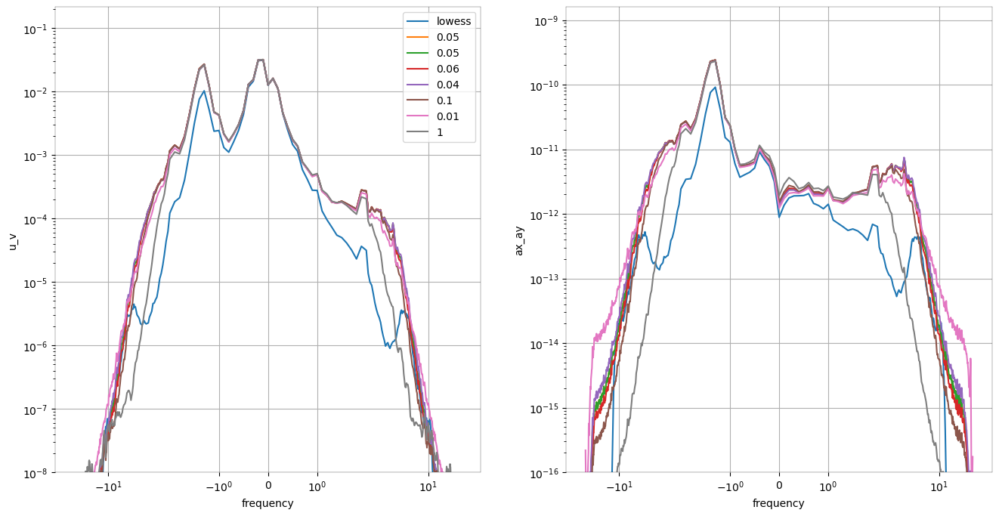

In [16]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='0.05')
dss2.mean('id').u_v.plot(ax=ax, label='0.05')
dss3.mean('id').u_v.plot(ax=ax, label='0.06')
dss4.mean('id').u_v.plot(ax=ax, label='0.04')
dss5.mean('id').u_v.plot(ax=ax, label='0.1')
dss6.mean('id').u_v.plot(ax=ax, label='0.01')
dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-8)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()

## Pour dti =30min, timechunk
- take 

In [17]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['time_chunk']=3
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['time_chunk']=10
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['time_chunk']=0.5
ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 11 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chu

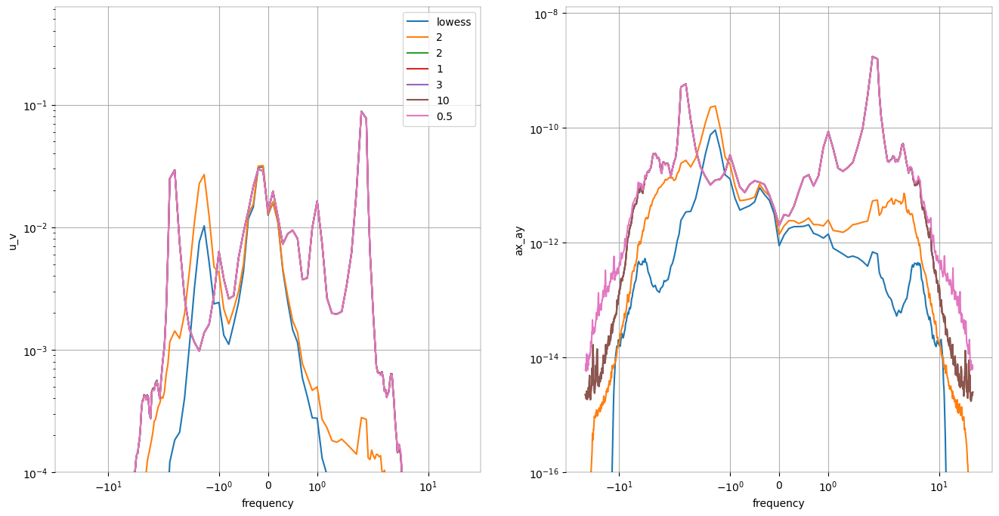

In [19]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
#dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='2')
dss2.mean('id').u_v.plot(ax=ax, label='2')
dss3.mean('id').u_v.plot(ax=ax, label='1')
dss4.mean('id').u_v.plot(ax=ax, label='3')
dss5.mean('id').u_v.plot(ax=ax, label='10')
dss6.mean('id').u_v.plot(ax=ax, label='0.5')
#dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-4)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
#dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()

## Pour dti =30min, position error
- take 

In [16]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=35
ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=45
ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=55
ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)
param_var['position_error']=75
ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var)

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 12 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chu

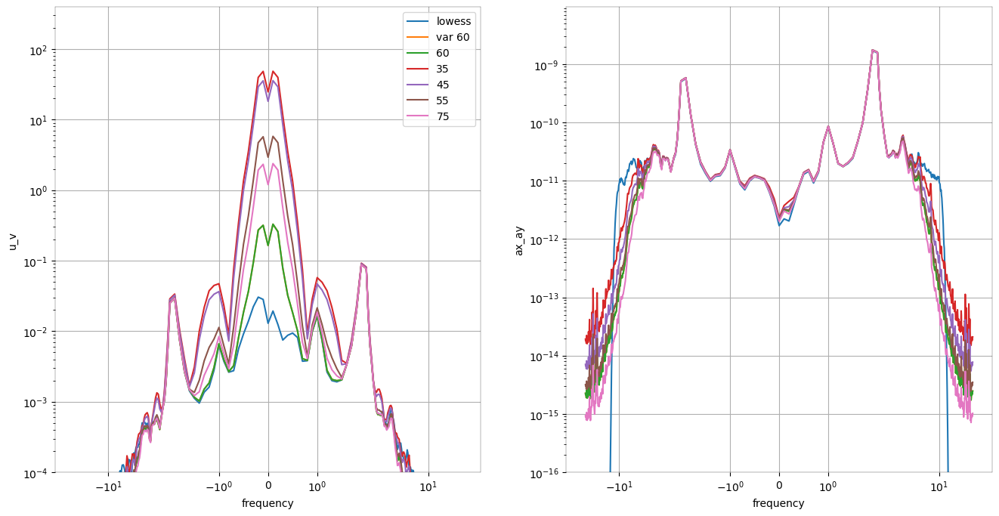

In [17]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
#dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='var 60')
dss2.mean('id').u_v.plot(ax=ax, label='60')
dss3.mean('id').u_v.plot(ax=ax, label='35')
dss4.mean('id').u_v.plot(ax=ax, label='45')
dss5.mean('id').u_v.plot(ax=ax, label='55')
dss6.mean('id').u_v.plot(ax=ax, label='75')
#dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-4)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
#dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()

## Pour dti =30min, maxgap
- take 

In [5]:
path_L1 = '/Users/mdemol/DATA_DRIFTERS/drifters/raw/L1_carthe_uwa_20231006_094155_5min.csv'
df_L1 =pd.read_csv(path_L1, parse_dates=["time"], dtype={"id": str})

param_var = dict(
    acc_cut=1,
    position_error=60,
    acceleration_amplitude=5e-6,
    acceleration_T=0.05 * 86400,
    time_chunk=2,
    acc_cut_key=("acceleration_east", "acceleration_north", "acceleration"),
)
    
ds2 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=3*3600)

ds3 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=4*3600)

ds4 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=5*3600)

ds5 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=6*3600)

ds6 = apply_optimize_smoothing(path_L1, t_target='30min', method='variational', version=version, param=param_var, maxgap=30*86400)# gap infini

Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 2 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 3 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 11 segments
Chunking dataframe into 2 days chunks
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking dataframe into 2 days chunks
Divided into 1 segments
Chunking datafram

In [9]:
ds6.x.hvplot(kind='scatter', label='variational over the whole trajectory')* ds1.x.hvplot(kind='scatter', label='Raw') + ds1.u.hvplot(kind='scatter')* ds6.u.hvplot(kind='scatter')

:Layout
   .DynamicMap.I  :DynamicMap   [id]
      :Overlay
         .Scatter.Variational_over_the_whole_trajectory :Scatter   [time]   (x)
         .Scatter.Raw                                   :Scatter   [time]   (x)
   .DynamicMap.II :DynamicMap   [id]
      :Overlay
         .Scatter.I  :Scatter   [time]   (u)
         .Scatter.II :Scatter   [time]   (u)

In [12]:
ds2.x.hvplot(kind='scatter', label='3h')* ds4.x.hvplot(kind='scatter', label='5h')*ds1.x.hvplot(kind='scatter', label='Raw') + ds2.u.hvplot(kind='scatter')* ds4.u.hvplot(kind='scatter')*ds1.u.hvplot(kind='scatter', label='Raw')

:Layout
   .DynamicMap.I  :DynamicMap   [id]
      :Overlay
         .Scatter.A_3h :Scatter   [time]   (x)
         .Scatter.A_5h :Scatter   [time]   (x)
         .Scatter.Raw  :Scatter   [time]   (x)
   .DynamicMap.II :DynamicMap   [id]
      :Overlay
         .Scatter.I   :Scatter   [time]   (u)
         .Scatter.II  :Scatter   [time]   (u)
         .Scatter.Raw :Scatter   [time]   (u)

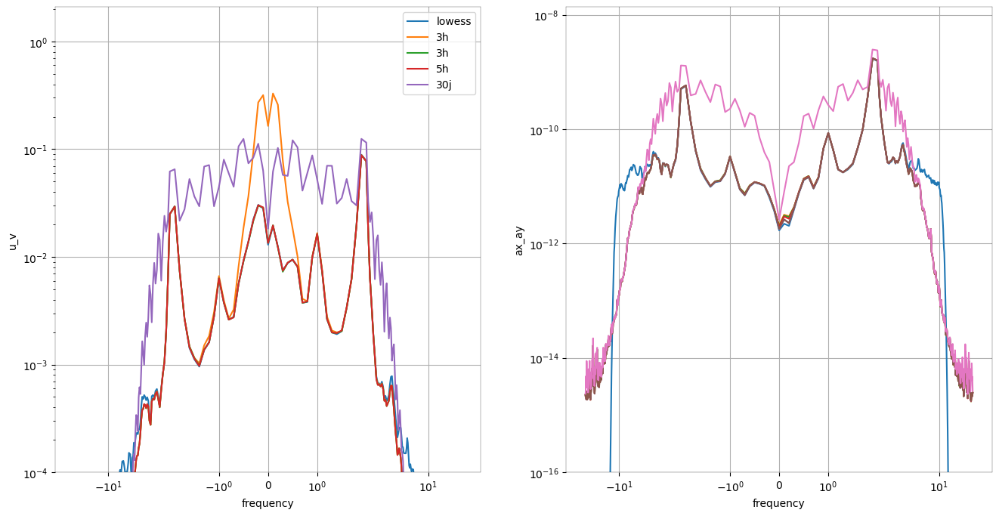

In [16]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
#dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
dss2s.mean('id').u_v.plot(ax=ax, label='lowess')
dss2v.mean('id').u_v.plot(ax=ax, label='3h')
dss2.mean('id').u_v.plot(ax=ax, label='3h')
#dss3.mean('id').u_v.plot(ax=ax, label='4h')
dss4.mean('id').u_v.plot(ax=ax, label='5h')
#dss5.mean('id').u_v.plot(ax=ax, label='6h')
dss6.mean('id').u_v.plot(ax=ax, label='30j')
#dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-4)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
#dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()

<xarray.DataArray 'id' ()>
array('0-4698195', dtype='<U9')
Coordinates:
    id       <U9 '0-4698195'
Attributes:
    longname:     id
    description:  drifter id


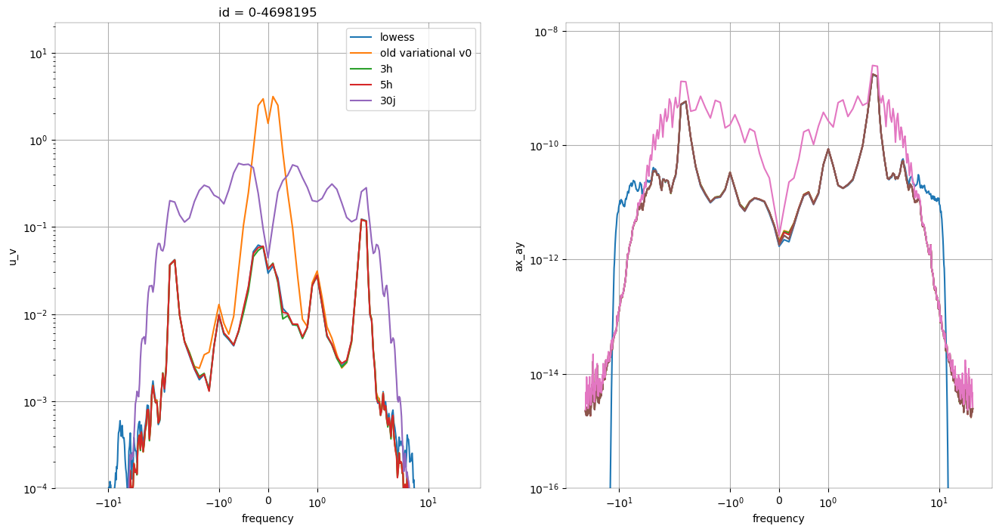

In [18]:
dss2s = spectrum_var(ds2s)
dss2v = spectrum_var(ds2v)
dss2 = spectrum_var(ds2)
dss3 = spectrum_var(ds3)
dss4 = spectrum_var(ds4)
dss5 = spectrum_var(ds5)
dss6 = spectrum_var(ds6)
#dss7 = spectrum_var(ds7)

fig, axs = plt.subplots(1,2, figsize=(16,8))
ax=axs[0]
i=7
print(dss2s.isel(id=i).id)
dss2s.isel(id=i).u_v.plot(ax=ax, label='lowess')
dss2v.isel(id=i).u_v.plot(ax=ax, label='old variational v0')
dss2.isel(id=i).u_v.plot(ax=ax, label='3h')
#dss3.mean('id').u_v.plot(ax=ax, label='4h')
dss4.isel(id=i).u_v.plot(ax=ax, label='5h')
#dss5.mean('id').u_v.plot(ax=ax, label='6h')
dss6.isel(id=i).u_v.plot(ax=ax, label='30j')
#dss7.mean('id').u_v.plot(ax=ax, label='1')

ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.grid()
ax.legend()
ax.set_ylim(1e-4)

ax=axs[1]
dss2s.mean('id').ax_ay.plot(ax=ax, label='lowess')
dss2v.mean('id').ax_ay.plot(ax=ax, label='var0')
dss2.mean('id').ax_ay.plot(ax=ax)
dss3.mean('id').ax_ay.plot(ax=ax)
dss4.mean('id').ax_ay.plot(ax=ax)
dss5.mean('id').ax_ay.plot(ax=ax)
dss6.mean('id').ax_ay.plot(ax=ax)
#dss7.mean('id').ax_ay.plot(ax=ax, label='1')
ax.set_xscale("symlog")#, linthresh=linthresh, linscale=linscale)
ax.set_yscale("log")
ax.set_ylim(1e-16)
ax.grid()